# Project deliverable : 
## Choudhary Usman Alam 
## Saadi Humayun
## Instructor : Sir Murtaza Taj
## TA : Aamil Khan

# Importing Necessary Libraries

In [11]:
import os
import json
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
!pip install PytorchWildlife

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 820.5/820.5 kB 29.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.9/46.9 MB 38.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 

# Importing MegaDetector Detection Model 

In [14]:
from PytorchWildlife.models import detection as pw_detection
detection_model = pw_detection.MegaDetectorV6(version='MDV6-yolov9-c', device='cuda')

Ultralytics 8.3.108 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs




# Flattening Image Directories

In [1]:
import os
import shutil

src_root = '/kaggle/input/missouri-deer-species'
dst_root = '/kaggle/working/flattened_dataset'

for class_name in os.listdir(src_root):
    class_path = os.path.join(src_root, class_name)
    
    if not os.path.isdir(class_path):
        continue

    print(f"Processing class: {class_name}")

    flattened_class_dir = os.path.join(dst_root, class_name)
    os.makedirs(flattened_class_dir, exist_ok=True)

    for subfolder in os.listdir(class_path):
        subfolder_path = os.path.join(class_path, subfolder)
        
        if not os.path.isdir(subfolder_path):
            continue

        for filename in os.listdir(subfolder_path):
            src_img = os.path.join(subfolder_path, filename)
            dst_img = os.path.join(flattened_class_dir, f"{subfolder}_{filename}")
            shutil.copy2(src_img, dst_img)

print(" Flattening complete.")


Processing class: 1.57-Red_Deer
Processing class: 1.58-Roe_Deer
Processing class: 1.07-Red_Brocket_Deer
Processing class: 1.27-White_Tailed_Deer
✅ Flattening complete.


# Visualizing the dataset 


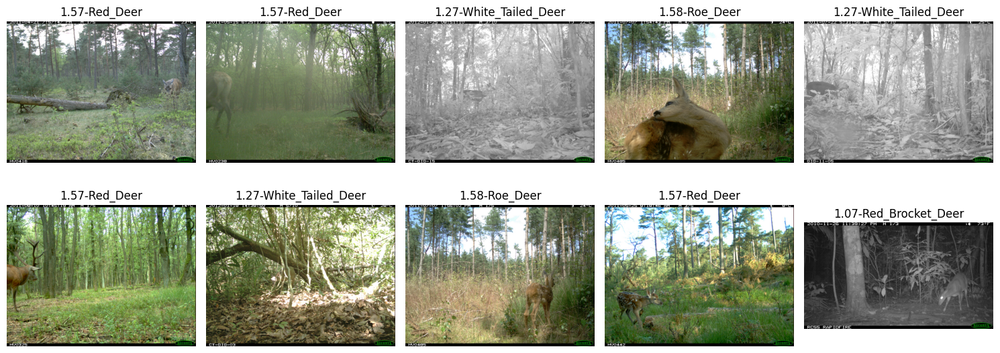

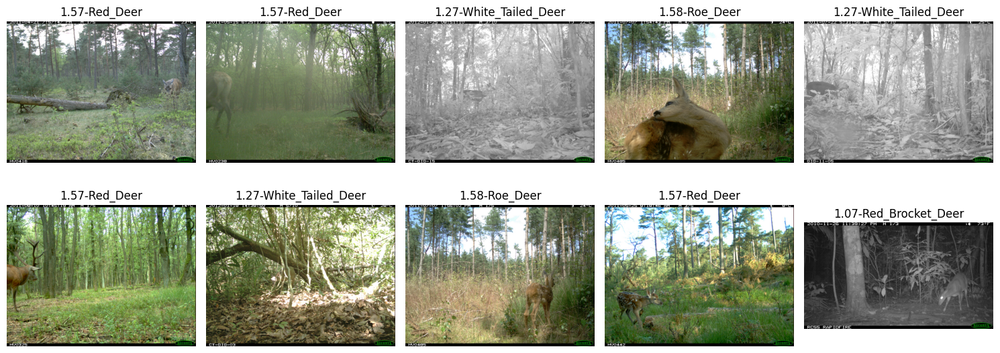

In [8]:
import os
import random
import matplotlib.pyplot as plt
from IPython.display import display
import matplotlib.image as mpimg

flattened_root = '/kaggle/working/flattened_dataset'

all_images = []
for class_name in os.listdir(flattened_root):
    class_dir = os.path.join(flattened_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    for img_file in os.listdir(class_dir):
        all_images.append((os.path.join(class_dir, img_file), class_name))

random_images = random.sample(all_images, 10)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for ax, (img_path, label) in zip(axes.flatten(), random_images):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
display(fig)

# Detection of Animals using MegaDetector 

In [5]:
import os
import json
import numpy as np
from PIL import Image
from tqdm import tqdm

flattened_root = "/kaggle/working/flattened_dataset"
detection_model = pw_detection.MegaDetectorV6(version="MDV6-yolov9-c")
detection_data = {}

for root, dirs, files in os.walk(flattened_root):
    for file in tqdm(files, desc=f"Processing images in {root}"):
        if not file.lower().endswith((".jpg", ".jpeg", ".png")):
            continue

        img_path = os.path.join(root, file)
        relative_path = os.path.relpath(img_path, flattened_root)

        try:
            img_pil = Image.open(img_path).convert("RGB")
            img_np = np.array(img_pil)
            result = detection_model.single_image_detection(img_np)
            detections = result["detections"]

            detection_data[relative_path] = []

            for i in range(len(detections.xyxy)):
                bbox = detections.xyxy[i].tolist()
                conf = float(detections.confidence[i])
                class_id = int(detections.class_id[i])
                
                detection_data[relative_path].append({
                    "bbox": bbox,
                    "confidence": conf,
                    "class": "animal"
                })

        except Exception as e:
            print(f"Error processing {img_path}: {e}")

with open("flattened_detections.json", "w") as f:
    json.dump(detection_data, f, indent=2)

print("Detection results saved to flattened_detections.json")


Ultralytics 8.3.108 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


Processing images in /kaggle/working/flattened_dataset: 0it [00:00, ?it/s]
Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   0%|          | 0/2208 [00:00<?, ?it/s]


0: 640x640 1 animal, 47.7ms
Speed: 2.9ms preprocess, 47.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   0%|          | 1/2208 [00:00<05:15,  6.99it/s]


0: 640x640 1 animal, 39.5ms
Speed: 2.7ms preprocess, 39.5ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 38.3ms
Speed: 3.2ms preprocess, 38.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   0%|          | 3/2208 [00:00<03:22, 10.90it/s]


0: 640x640 1 animal, 38.0ms
Speed: 3.0ms preprocess, 38.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 29.9ms
Speed: 2.6ms preprocess, 29.9ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   0%|          | 5/2208 [00:00<02:54, 12.64it/s]


0: 640x640 1 animal, 29.9ms
Speed: 2.6ms preprocess, 29.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 29.9ms
Speed: 3.1ms preprocess, 29.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   0%|          | 7/2208 [00:00<02:38, 13.92it/s]


0: 640x640 1 animal, 28.0ms
Speed: 3.0ms preprocess, 28.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 27.9ms
Speed: 3.0ms preprocess, 27.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   0%|          | 9/2208 [00:00<02:33, 14.37it/s]


0: 640x640 1 animal, 28.0ms
Speed: 2.9ms preprocess, 28.0ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.9ms
Speed: 2.6ms preprocess, 26.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   0%|          | 11/2208 [00:00<02:24, 15.20it/s]


0: 640x640 1 animal, 26.7ms
Speed: 3.0ms preprocess, 26.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.7ms
Speed: 2.9ms preprocess, 26.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 13/2208 [00:00<02:24, 15.21it/s]


0: 640x640 1 animal, 26.6ms
Speed: 3.1ms preprocess, 26.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.6ms
Speed: 3.3ms preprocess, 26.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 15/2208 [00:01<02:22, 15.40it/s]


0: 640x640 1 person, 26.3ms
Speed: 3.1ms preprocess, 26.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 26.1ms
Speed: 2.9ms preprocess, 26.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 17/2208 [00:01<02:21, 15.49it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 2.5ms preprocess, 25.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 19/2208 [00:01<02:17, 15.86it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.6ms
Speed: 3.3ms preprocess, 25.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 21/2208 [00:01<02:16, 15.98it/s]


0: 640x640 1 animal, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 23/2208 [00:01<02:16, 16.02it/s]


0: 640x640 1 animal, 25.8ms
Speed: 3.6ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.4ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 25/2208 [00:01<02:20, 15.51it/s]


0: 640x640 1 animal, 25.7ms
Speed: 3.1ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 2.8ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|          | 27/2208 [00:01<02:15, 16.14it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.2ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|▏         | 29/2208 [00:01<02:13, 16.36it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|▏         | 31/2208 [00:02<02:10, 16.70it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   1%|▏         | 33/2208 [00:02<02:07, 17.07it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.5ms
Speed: 3.2ms preprocess, 25.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 35/2208 [00:02<02:05, 17.27it/s]


0: 640x640 1 animal, 25.6ms
Speed: 3.1ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 2.9ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 37/2208 [00:02<02:05, 17.32it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.3ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 39/2208 [00:02<02:05, 17.22it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 41/2208 [00:02<02:06, 17.10it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.3ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 3.1ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 43/2208 [00:02<02:05, 17.22it/s]


0: 640x640 1 animal, 25.7ms
Speed: 2.7ms preprocess, 25.7ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 45/2208 [00:02<02:08, 16.79it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 47/2208 [00:02<02:11, 16.47it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 49/2208 [00:03<02:14, 16.09it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.2ms
Speed: 2.8ms preprocess, 26.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 51/2208 [00:03<02:06, 17.07it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.2ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 53/2208 [00:03<02:10, 16.49it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   2%|▏         | 55/2208 [00:03<02:14, 16.02it/s]


0: 640x640 (no detections), 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.3ms
Speed: 2.7ms preprocess, 24.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 57/2208 [00:03<02:14, 15.98it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 59/2208 [00:03<02:19, 15.43it/s]


0: 640x640 (no detections), 25.9ms
Speed: 2.5ms preprocess, 25.9ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 2.5ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 61/2208 [00:03<02:11, 16.38it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 2.5ms preprocess, 24.8ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 63/2208 [00:03<02:10, 16.39it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 2.5ms preprocess, 25.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 65/2208 [00:04<02:10, 16.45it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 67/2208 [00:04<02:13, 16.00it/s]


0: 640x640 (no detections), 23.9ms
Speed: 3.2ms preprocess, 23.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 69/2208 [00:04<02:12, 16.15it/s]


0: 640x640 1 animal, 24.4ms
Speed: 2.7ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 71/2208 [00:04<02:10, 16.40it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 73/2208 [00:04<02:11, 16.21it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 75/2208 [00:04<02:11, 16.26it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.2ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   3%|▎         | 77/2208 [00:04<02:14, 15.89it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▎         | 79/2208 [00:04<02:15, 15.71it/s]


0: 640x640 (no detections), 24.5ms
Speed: 2.6ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.0ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▎         | 81/2208 [00:05<02:08, 16.59it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 83/2208 [00:05<02:11, 16.13it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.5ms preprocess, 23.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 85/2208 [00:05<02:14, 15.81it/s]


0: 640x640 1 animal, 25.6ms
Speed: 2.5ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 87/2208 [00:05<02:08, 16.49it/s]


0: 640x640 (no detections), 25.3ms
Speed: 2.8ms preprocess, 25.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 2.7ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.3ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 90/2208 [00:05<02:01, 17.39it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 2.9ms preprocess, 24.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 92/2208 [00:05<02:06, 16.74it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.7ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.9ms
Speed: 3.4ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 94/2208 [00:05<02:03, 17.09it/s]


0: 640x640 (no detections), 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 96/2208 [00:05<02:07, 16.53it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   4%|▍         | 98/2208 [00:06<02:11, 16.08it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.1ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.1ms
Speed: 2.6ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▍         | 100/2208 [00:06<02:09, 16.26it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▍         | 102/2208 [00:06<02:08, 16.43it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▍         | 104/2208 [00:06<02:11, 15.98it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.2ms preprocess, 24.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▍         | 106/2208 [00:06<02:15, 15.57it/s]


0: 640x640 (no detections), 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▍         | 108/2208 [00:06<02:15, 15.46it/s]


0: 640x640 (no detections), 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 2.8ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 2.5ms preprocess, 25.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▌         | 111/2208 [00:06<02:02, 17.18it/s]


0: 640x640 1 animal, 24.8ms
Speed: 2.9ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▌         | 113/2208 [00:07<01:59, 17.47it/s]


0: 640x640 (no detections), 24.4ms
Speed: 3.3ms preprocess, 24.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 2.6ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▌         | 115/2208 [00:07<02:00, 17.31it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.0ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▌         | 117/2208 [00:07<02:03, 16.93it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▌         | 119/2208 [00:07<02:07, 16.45it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   5%|▌         | 121/2208 [00:07<02:04, 16.74it/s]


0: 640x640 2 animals, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 3.0ms preprocess, 25.7ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 123/2208 [00:07<02:09, 16.13it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 125/2208 [00:07<02:09, 16.07it/s]


0: 640x640 (no detections), 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 2.8ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 127/2208 [00:07<02:02, 16.93it/s]


0: 640x640 1 animal, 24.0ms
Speed: 3.3ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.4ms
Speed: 3.1ms preprocess, 25.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 129/2208 [00:07<02:07, 16.36it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.3ms preprocess, 25.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 131/2208 [00:08<02:04, 16.65it/s]


0: 640x640 (no detections), 24.9ms
Speed: 3.4ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 133/2208 [00:08<02:02, 16.93it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.2ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 3.3ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 135/2208 [00:08<02:01, 17.02it/s]


0: 640x640 (no detections), 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▌         | 137/2208 [00:08<01:57, 17.56it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.2ms
Speed: 3.2ms preprocess, 25.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▋         | 139/2208 [00:08<02:03, 16.71it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.2ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.3ms
Speed: 3.0ms preprocess, 25.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▋         | 141/2208 [00:08<02:01, 17.02it/s]


0: 640x640 1 animal, 25.6ms
Speed: 3.4ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.3ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   6%|▋         | 143/2208 [00:08<02:00, 17.12it/s]


0: 640x640 (no detections), 25.5ms
Speed: 3.4ms preprocess, 25.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 3.2ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 145/2208 [00:08<02:01, 17.01it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.2ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 147/2208 [00:09<01:59, 17.26it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 2.5ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 149/2208 [00:09<01:58, 17.41it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 151/2208 [00:09<02:01, 16.90it/s]


0: 640x640 (no detections), 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.1ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 153/2208 [00:09<02:00, 17.12it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 155/2208 [00:09<01:57, 17.41it/s]


0: 640x640 1 animal, 27.0ms
Speed: 2.8ms preprocess, 27.0ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.3ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 157/2208 [00:09<02:02, 16.75it/s]


0: 640x640 1 animal, 25.4ms
Speed: 3.3ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 159/2208 [00:09<02:06, 16.21it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.3ms preprocess, 25.3ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.0ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 161/2208 [00:09<02:04, 16.48it/s]


0: 640x640 1 animal, 26.0ms
Speed: 3.1ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 3.0ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 163/2208 [00:09<02:06, 16.16it/s]


0: 640x640 1 animal, 26.2ms
Speed: 3.2ms preprocess, 26.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 2.7ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   7%|▋         | 165/2208 [00:10<02:04, 16.35it/s]


0: 640x640 (no detections), 26.3ms
Speed: 2.9ms preprocess, 26.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.2ms
Speed: 3.0ms preprocess, 26.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 167/2208 [00:10<02:00, 16.89it/s]


0: 640x640 1 animal, 26.0ms
Speed: 2.4ms preprocess, 26.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.9ms
Speed: 2.7ms preprocess, 25.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 170/2208 [00:10<01:58, 17.26it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.2ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.0ms
Speed: 3.2ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 172/2208 [00:10<02:03, 16.49it/s]


0: 640x640 (no detections), 25.6ms
Speed: 2.9ms preprocess, 25.6ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 3.2ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 174/2208 [00:10<02:00, 16.84it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.2ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 176/2208 [00:10<01:59, 16.96it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 178/2208 [00:10<01:58, 17.14it/s]


0: 640x640 (no detections), 26.3ms
Speed: 2.6ms preprocess, 26.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 180/2208 [00:10<01:59, 17.01it/s]


0: 640x640 1 animal, 26.0ms
Speed: 2.8ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 182/2208 [00:11<02:01, 16.74it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 184/2208 [00:11<02:00, 16.76it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.2ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   8%|▊         | 186/2208 [00:11<02:00, 16.82it/s]


0: 640x640 1 animal, 25.9ms
Speed: 2.7ms preprocess, 25.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.9ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▊         | 188/2208 [00:11<02:03, 16.40it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.9ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▊         | 190/2208 [00:11<02:03, 16.40it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.5ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.8ms preprocess, 25.4ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▊         | 192/2208 [00:11<02:00, 16.73it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 2.5ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 194/2208 [00:11<02:00, 16.78it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 196/2208 [00:11<02:02, 16.43it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.2ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 198/2208 [00:12<02:03, 16.34it/s]


0: 640x640 1 animal, 25.3ms
Speed: 2.4ms preprocess, 25.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 200/2208 [00:12<02:00, 16.64it/s]


0: 640x640 1 animal, 25.9ms
Speed: 2.5ms preprocess, 25.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 202/2208 [00:12<01:56, 17.19it/s]


0: 640x640 (no detections), 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 204/2208 [00:12<01:59, 16.72it/s]


0: 640x640 1 animal, 24.8ms
Speed: 2.8ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 3.3ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 206/2208 [00:12<01:55, 17.32it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:   9%|▉         | 208/2208 [00:12<01:58, 16.87it/s]


0: 640x640 2 animals, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 3.3ms preprocess, 26.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|▉         | 210/2208 [00:12<02:04, 16.11it/s]


0: 640x640 (no detections), 26.1ms
Speed: 3.3ms preprocess, 26.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.1ms
Speed: 3.0ms preprocess, 26.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|▉         | 212/2208 [00:12<02:01, 16.49it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|▉         | 214/2208 [00:13<01:58, 16.86it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 3.4ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|▉         | 216/2208 [00:13<01:56, 17.05it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|▉         | 218/2208 [00:13<01:55, 17.26it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.9ms
Speed: 2.5ms preprocess, 26.9ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|▉         | 220/2208 [00:13<01:52, 17.68it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.3ms
Speed: 3.3ms preprocess, 24.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|█         | 222/2208 [00:13<01:56, 17.11it/s]


0: 640x640 1 animal, 25.7ms
Speed: 2.6ms preprocess, 25.7ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 3.3ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|█         | 224/2208 [00:13<01:58, 16.76it/s]


0: 640x640 1 animal, 25.8ms
Speed: 3.0ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 3.1ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|█         | 226/2208 [00:13<02:00, 16.43it/s]


0: 640x640 1 animal, 26.1ms
Speed: 3.0ms preprocess, 26.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.8ms
Speed: 2.9ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|█         | 228/2208 [00:13<02:03, 16.05it/s]


0: 640x640 1 animal, 25.8ms
Speed: 2.8ms preprocess, 25.8ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  10%|█         | 230/2208 [00:13<02:02, 16.12it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 3.0ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 232/2208 [00:14<02:04, 15.87it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 234/2208 [00:14<01:59, 16.45it/s]


0: 640x640 2 animals, 23.8ms
Speed: 2.9ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 3.1ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 236/2208 [00:14<02:02, 16.06it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 238/2208 [00:14<02:04, 15.88it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.2ms preprocess, 23.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 240/2208 [00:14<02:05, 15.63it/s]


0: 640x640 1 animal, 26.1ms
Speed: 2.6ms preprocess, 26.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 242/2208 [00:14<01:58, 16.55it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.1ms preprocess, 24.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.5ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 244/2208 [00:14<01:57, 16.68it/s]


0: 640x640 1 animal, 26.3ms
Speed: 2.6ms preprocess, 26.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 246/2208 [00:14<01:54, 17.20it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.5ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 27.0ms
Speed: 2.7ms preprocess, 27.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█         | 248/2208 [00:15<01:50, 17.75it/s]


0: 640x640 (no detections), 25.0ms
Speed: 2.7ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.7ms
Speed: 3.2ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█▏        | 250/2208 [00:15<01:55, 16.96it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.7ms
Speed: 2.7ms preprocess, 26.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  11%|█▏        | 252/2208 [00:15<01:54, 17.01it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 3.1ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 254/2208 [00:15<01:59, 16.42it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 2.6ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 256/2208 [00:15<01:56, 16.70it/s]


0: 640x640 1 animal, 26.6ms
Speed: 2.6ms preprocess, 26.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.2ms
Speed: 2.7ms preprocess, 26.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 259/2208 [00:15<01:51, 17.47it/s]


0: 640x640 1 animal, 25.6ms
Speed: 2.8ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 261/2208 [00:15<01:49, 17.80it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.3ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 2.6ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 263/2208 [00:15<01:50, 17.59it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.5ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 265/2208 [00:16<01:55, 16.87it/s]


0: 640x640 (no detections), 24.9ms
Speed: 2.5ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 2.6ms preprocess, 25.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 267/2208 [00:16<01:50, 17.61it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 269/2208 [00:16<01:55, 16.86it/s]


0: 640x640 2 animals, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 271/2208 [00:16<01:59, 16.22it/s]


0: 640x640 2 animals, 23.7ms
Speed: 3.2ms preprocess, 23.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 2.9ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 273/2208 [00:16<02:01, 15.90it/s]


0: 640x640 1 animal, 26.1ms
Speed: 2.5ms preprocess, 26.1ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.2ms
Speed: 3.3ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  12%|█▏        | 275/2208 [00:16<02:01, 15.97it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 277/2208 [00:16<02:01, 15.88it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.2ms preprocess, 24.2ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 279/2208 [00:16<01:57, 16.39it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.2ms preprocess, 24.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 281/2208 [00:17<01:59, 16.16it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 283/2208 [00:17<01:59, 16.13it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 285/2208 [00:17<01:59, 16.07it/s]


0: 640x640 (no detections), 24.2ms
Speed: 3.4ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 2.9ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 287/2208 [00:17<02:01, 15.80it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 289/2208 [00:17<02:04, 15.39it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 291/2208 [00:17<02:05, 15.27it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 293/2208 [00:17<02:05, 15.23it/s]


0: 640x640 (no detections), 26.3ms
Speed: 2.5ms preprocess, 26.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 2.7ms preprocess, 26.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.4ms
Speed: 2.4ms preprocess, 26.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 296/2208 [00:17<01:52, 17.06it/s]


0: 640x640 1 animal, 26.3ms
Speed: 2.8ms preprocess, 26.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  13%|█▎        | 298/2208 [00:18<01:49, 17.38it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▎        | 300/2208 [00:18<01:52, 16.97it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.4ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.3ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▎        | 302/2208 [00:18<01:53, 16.73it/s]


0: 640x640 1 animal, 25.3ms
Speed: 2.7ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 304/2208 [00:18<01:53, 16.81it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 306/2208 [00:18<01:54, 16.55it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 308/2208 [00:18<01:58, 16.05it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 310/2208 [00:18<02:00, 15.74it/s]


0: 640x640 (no detections), 25.2ms
Speed: 3.1ms preprocess, 25.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 312/2208 [00:18<01:55, 16.40it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.2ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 314/2208 [00:19<01:54, 16.60it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.2ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 316/2208 [00:19<01:52, 16.88it/s]


0: 640x640 1 animal, 25.5ms
Speed: 3.1ms preprocess, 25.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.9ms
Speed: 3.0ms preprocess, 25.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 318/2208 [00:19<01:51, 17.00it/s]


0: 640x640 (no detections), 25.5ms
Speed: 3.2ms preprocess, 25.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  14%|█▍        | 320/2208 [00:19<01:52, 16.77it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.3ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 3.4ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▍        | 322/2208 [00:19<01:54, 16.44it/s]


0: 640x640 1 animal, 25.6ms
Speed: 3.2ms preprocess, 25.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▍        | 324/2208 [00:19<01:54, 16.52it/s]


0: 640x640 1 animal, 25.7ms
Speed: 2.6ms preprocess, 25.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.7ms preprocess, 25.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▍        | 326/2208 [00:19<01:50, 17.10it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.3ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.9ms
Speed: 3.9ms preprocess, 23.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▍        | 328/2208 [00:19<02:01, 15.54it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.7ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▍        | 330/2208 [00:20<01:55, 16.29it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.3ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▌        | 332/2208 [00:20<01:58, 15.87it/s]


0: 640x640 (no detections), 24.5ms
Speed: 4.1ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.6ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▌        | 334/2208 [00:20<01:57, 15.92it/s]


0: 640x640 1 animal, 26.2ms
Speed: 2.8ms preprocess, 26.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.9ms preprocess, 25.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▌        | 336/2208 [00:20<01:51, 16.76it/s]


0: 640x640 1 animal, 26.2ms
Speed: 2.9ms preprocess, 26.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 3.4ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▌        | 338/2208 [00:20<01:51, 16.74it/s]


0: 640x640 1 animal, 26.5ms
Speed: 2.8ms preprocess, 26.5ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.2ms
Speed: 3.3ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▌        | 340/2208 [00:20<01:53, 16.51it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  15%|█▌        | 342/2208 [00:20<01:54, 16.25it/s]


0: 640x640 (no detections), 24.7ms
Speed: 3.4ms preprocess, 24.7ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 344/2208 [00:20<01:59, 15.58it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 2.7ms preprocess, 25.6ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 346/2208 [00:21<01:53, 16.42it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.2ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 348/2208 [00:21<01:53, 16.33it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 350/2208 [00:21<01:54, 16.28it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 352/2208 [00:21<01:54, 16.14it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 354/2208 [00:21<01:51, 16.62it/s]


0: 640x640 1 animal, 25.4ms
Speed: 3.1ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.6ms preprocess, 24.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 356/2208 [00:21<01:50, 16.69it/s]


0: 640x640 1 animal, 24.6ms
Speed: 2.5ms preprocess, 24.6ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▌        | 358/2208 [00:21<01:53, 16.36it/s]


0: 640x640 1 animal, 25.5ms
Speed: 2.8ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▋        | 360/2208 [00:21<01:48, 16.97it/s]


0: 640x640 1 animal, 25.5ms
Speed: 2.6ms preprocess, 25.5ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▋        | 362/2208 [00:22<01:49, 16.80it/s]


0: 640x640 1 animal, 25.4ms
Speed: 2.7ms preprocess, 25.4ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 animals, 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  16%|█▋        | 364/2208 [00:22<01:52, 16.46it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.2ms
Speed: 3.4ms preprocess, 25.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 366/2208 [00:22<01:55, 15.94it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 368/2208 [00:22<01:57, 15.66it/s]


0: 640x640 1 animal, 25.5ms
Speed: 3.2ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 2.7ms preprocess, 25.2ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 370/2208 [00:22<01:52, 16.35it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 372/2208 [00:22<01:56, 15.70it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 3.3ms preprocess, 25.0ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 374/2208 [00:22<01:56, 15.76it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.7ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 376/2208 [00:22<01:53, 16.10it/s]


0: 640x640 1 animal, 26.2ms
Speed: 2.5ms preprocess, 26.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 2.8ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 378/2208 [00:22<01:47, 17.05it/s]


0: 640x640 (no detections), 24.1ms
Speed: 3.1ms preprocess, 24.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 3.2ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 380/2208 [00:23<01:51, 16.36it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.2ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 382/2208 [00:23<01:52, 16.21it/s]


0: 640x640 3 animals, 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.1ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 384/2208 [00:23<01:51, 16.37it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.2ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 3.1ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  17%|█▋        | 386/2208 [00:23<01:48, 16.75it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.4ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 388/2208 [00:23<01:47, 17.00it/s]


0: 640x640 1 animal, 26.4ms
Speed: 2.7ms preprocess, 26.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 3.4ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 390/2208 [00:23<01:49, 16.54it/s]


0: 640x640 1 animal, 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 3.3ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 392/2208 [00:23<01:48, 16.78it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.2ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 394/2208 [00:23<01:47, 16.90it/s]


0: 640x640 (no detections), 25.6ms
Speed: 3.1ms preprocess, 25.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.3ms
Speed: 3.1ms preprocess, 26.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 396/2208 [00:24<01:46, 17.05it/s]


0: 640x640 1 animal, 26.4ms
Speed: 3.0ms preprocess, 26.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.4ms
Speed: 3.2ms preprocess, 26.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 398/2208 [00:24<01:45, 17.13it/s]


0: 640x640 1 animal, 25.6ms
Speed: 3.0ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 400/2208 [00:24<01:46, 16.96it/s]


0: 640x640 1 animal, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 402/2208 [00:24<01:48, 16.59it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.5ms
Speed: 2.7ms preprocess, 26.5ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 404/2208 [00:24<01:44, 17.19it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.4ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.1ms
Speed: 2.7ms preprocess, 26.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 406/2208 [00:24<01:45, 17.01it/s]


0: 640x640 1 animal, 25.6ms
Speed: 2.7ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  18%|█▊        | 408/2208 [00:24<01:46, 16.87it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.2ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 2.9ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▊        | 410/2208 [00:24<01:49, 16.49it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.0ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▊        | 412/2208 [00:25<01:51, 16.18it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.3ms preprocess, 24.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 414/2208 [00:25<01:48, 16.54it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 3.1ms preprocess, 25.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 416/2208 [00:25<01:46, 16.82it/s]


0: 640x640 1 animal, 25.6ms
Speed: 3.3ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 person, 25.4ms
Speed: 2.9ms preprocess, 25.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 418/2208 [00:25<01:47, 16.69it/s]


0: 640x640 1 animal, 25.6ms
Speed: 2.8ms preprocess, 25.6ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 420/2208 [00:25<01:48, 16.54it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.8ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 422/2208 [00:25<01:44, 17.13it/s]


0: 640x640 1 animal, 26.7ms
Speed: 3.2ms preprocess, 26.7ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 424/2208 [00:25<01:45, 16.89it/s]


0: 640x640 2 animals, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 426/2208 [00:25<01:49, 16.31it/s]


0: 640x640 1 animal, 25.2ms
Speed: 2.8ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 2.7ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.8ms
Speed: 2.8ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  19%|█▉        | 429/2208 [00:26<01:39, 17.79it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|█▉        | 431/2208 [00:26<01:42, 17.36it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 2.9ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|█▉        | 433/2208 [00:26<01:42, 17.33it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.6ms
Speed: 2.5ms preprocess, 25.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|█▉        | 435/2208 [00:26<01:38, 17.97it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.5ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|█▉        | 437/2208 [00:26<01:37, 18.17it/s]


0: 640x640 1 animal, 23.9ms
Speed: 3.1ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|█▉        | 439/2208 [00:26<01:41, 17.45it/s]


0: 640x640 1 animal, 25.9ms
Speed: 2.5ms preprocess, 25.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 3.2ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|█▉        | 441/2208 [00:26<01:40, 17.67it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.6ms preprocess, 24.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 2.8ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|██        | 443/2208 [00:26<01:36, 18.26it/s]


0: 640x640 2 animals, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|██        | 445/2208 [00:26<01:41, 17.45it/s]


0: 640x640 4 animals, 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.4ms
Speed: 2.7ms preprocess, 26.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|██        | 447/2208 [00:27<01:41, 17.35it/s]


0: 640x640 (no detections), 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|██        | 449/2208 [00:27<01:42, 17.13it/s]


0: 640x640 1 animal, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.5ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  20%|██        | 451/2208 [00:27<01:41, 17.25it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 453/2208 [00:27<01:46, 16.49it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 455/2208 [00:27<01:41, 17.22it/s]


0: 640x640 (no detections), 24.3ms
Speed: 3.2ms preprocess, 24.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 457/2208 [00:27<01:45, 16.54it/s]


0: 640x640 1 animal, 25.6ms
Speed: 2.5ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 459/2208 [00:27<01:41, 17.23it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.2ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.5ms
Speed: 2.8ms preprocess, 26.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 461/2208 [00:27<01:43, 16.86it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 463/2208 [00:28<01:43, 16.88it/s]


0: 640x640 (no detections), 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.1ms
Speed: 2.6ms preprocess, 26.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 465/2208 [00:28<01:43, 16.90it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.8ms
Speed: 2.6ms preprocess, 26.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 467/2208 [00:28<01:39, 17.50it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██        | 469/2208 [00:28<01:41, 17.09it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.0ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██▏       | 471/2208 [00:28<01:45, 16.50it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  21%|██▏       | 473/2208 [00:28<01:47, 16.07it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.1ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 475/2208 [00:28<01:50, 15.75it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 477/2208 [00:28<01:51, 15.52it/s]


0: 640x640 1 animal, 23.9ms
Speed: 3.3ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.7ms
Speed: 2.7ms preprocess, 26.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 479/2208 [00:28<01:48, 15.90it/s]


0: 640x640 (no detections), 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 3.1ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 481/2208 [00:29<01:48, 15.92it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.3ms preprocess, 24.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 483/2208 [00:29<01:50, 15.67it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.1ms preprocess, 23.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 485/2208 [00:29<01:52, 15.36it/s]


0: 640x640 1 animal, 26.9ms
Speed: 2.5ms preprocess, 26.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 2.9ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 487/2208 [00:29<01:45, 16.32it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.8ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.3ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 489/2208 [00:29<01:42, 16.83it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 animals, 25.7ms
Speed: 3.1ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 491/2208 [00:29<01:42, 16.67it/s]


0: 640x640 1 animal, 26.2ms
Speed: 2.7ms preprocess, 26.2ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.8ms
Speed: 3.3ms preprocess, 25.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 493/2208 [00:29<01:43, 16.52it/s]


0: 640x640 1 animal, 25.8ms
Speed: 3.0ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  22%|██▏       | 495/2208 [00:29<01:47, 16.00it/s]


0: 640x640 (no detections), 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.3ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 497/2208 [00:30<01:47, 15.94it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.1ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 499/2208 [00:30<01:44, 16.36it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.8ms
Speed: 2.6ms preprocess, 26.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 501/2208 [00:30<01:39, 17.23it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.6ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 503/2208 [00:30<01:40, 17.01it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.2ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.4ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 505/2208 [00:30<01:39, 17.09it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 2.9ms preprocess, 26.0ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 507/2208 [00:30<01:37, 17.40it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.6ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 509/2208 [00:30<01:42, 16.55it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.8ms
Speed: 3.1ms preprocess, 24.8ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 511/2208 [00:30<01:44, 16.23it/s]


0: 640x640 1 animal, 24.9ms
Speed: 2.8ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 513/2208 [00:31<01:43, 16.44it/s]


0: 640x640 (no detections), 25.2ms
Speed: 3.1ms preprocess, 25.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.8ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 515/2208 [00:31<01:40, 16.85it/s]


0: 640x640 1 animal, 24.4ms
Speed: 2.9ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  23%|██▎       | 517/2208 [00:31<01:44, 16.11it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.9ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.2ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▎       | 519/2208 [00:31<01:45, 16.07it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.2ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▎       | 521/2208 [00:31<01:41, 16.63it/s]


0: 640x640 1 animal, 26.8ms
Speed: 2.8ms preprocess, 26.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.6ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▎       | 523/2208 [00:31<01:46, 15.81it/s]


0: 640x640 (no detections), 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 26.1ms
Speed: 3.3ms preprocess, 26.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 525/2208 [00:31<01:44, 16.04it/s]


0: 640x640 1 animal, 26.0ms
Speed: 2.4ms preprocess, 26.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.2ms
Speed: 3.1ms preprocess, 26.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 527/2208 [00:31<01:44, 16.06it/s]


0: 640x640 1 animal, 25.8ms
Speed: 3.0ms preprocess, 25.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 3.3ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 529/2208 [00:32<01:42, 16.41it/s]


0: 640x640 1 animal, 25.8ms
Speed: 2.9ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.4ms
Speed: 2.5ms preprocess, 26.4ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 531/2208 [00:32<01:39, 16.87it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.2ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 533/2208 [00:32<01:42, 16.30it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 535/2208 [00:32<01:43, 16.24it/s]


0: 640x640 (no detections), 24.8ms
Speed: 3.2ms preprocess, 24.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.2ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 537/2208 [00:32<01:45, 15.91it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 3.0ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  24%|██▍       | 539/2208 [00:32<01:43, 16.14it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.1ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▍       | 541/2208 [00:32<01:38, 16.89it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.2ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 3.4ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▍       | 543/2208 [00:32<01:42, 16.32it/s]


0: 640x640 1 animal, 25.7ms
Speed: 2.7ms preprocess, 25.7ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▍       | 545/2208 [00:33<01:41, 16.40it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 2.7ms preprocess, 25.0ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▍       | 547/2208 [00:33<01:39, 16.78it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.5ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▍       | 549/2208 [00:33<01:38, 16.88it/s]


0: 640x640 1 animal, 25.4ms
Speed: 2.6ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▍       | 551/2208 [00:33<01:38, 16.81it/s]


0: 640x640 1 animal, 24.0ms
Speed: 3.2ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.2ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▌       | 553/2208 [00:33<01:39, 16.59it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.8ms
Speed: 2.4ms preprocess, 26.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▌       | 555/2208 [00:33<01:40, 16.50it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▌       | 557/2208 [00:33<01:42, 16.05it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.1ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▌       | 559/2208 [00:33<01:40, 16.48it/s]


0: 640x640 1 animal, 26.7ms
Speed: 2.7ms preprocess, 26.7ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 3.3ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▌       | 561/2208 [00:33<01:40, 16.46it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.2ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  25%|██▌       | 563/2208 [00:34<01:41, 16.18it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.7ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▌       | 565/2208 [00:34<01:38, 16.68it/s]


0: 640x640 1 animal, 26.0ms
Speed: 2.8ms preprocess, 26.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.4ms
Speed: 2.7ms preprocess, 26.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▌       | 568/2208 [00:34<01:34, 17.40it/s]


0: 640x640 (no detections), 25.4ms
Speed: 3.3ms preprocess, 25.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▌       | 570/2208 [00:34<01:32, 17.73it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.3ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▌       | 572/2208 [00:34<01:36, 16.91it/s]


0: 640x640 1 animal, 24.0ms
Speed: 3.1ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.8ms
Speed: 2.9ms preprocess, 24.8ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▌       | 574/2208 [00:34<01:38, 16.55it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▌       | 576/2208 [00:34<01:39, 16.32it/s]


0: 640x640 (no detections), 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 2.9ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▌       | 578/2208 [00:34<01:37, 16.69it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.1ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▋       | 580/2208 [00:35<01:35, 16.96it/s]


0: 640x640 1 animal, 25.4ms
Speed: 2.6ms preprocess, 25.4ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▋       | 582/2208 [00:35<01:36, 16.84it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 2.7ms preprocess, 25.6ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  26%|██▋       | 584/2208 [00:35<01:34, 17.12it/s]


0: 640x640 1 animal, 23.9ms
Speed: 3.1ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 586/2208 [00:35<01:38, 16.42it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 588/2208 [00:35<01:36, 16.77it/s]


0: 640x640 2 animals, 24.2ms
Speed: 3.3ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 590/2208 [00:35<01:39, 16.21it/s]


0: 640x640 1 animal, 24.4ms
Speed: 2.8ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 592/2208 [00:35<01:36, 16.70it/s]


0: 640x640 2 animals, 26.1ms
Speed: 2.6ms preprocess, 26.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 594/2208 [00:35<01:35, 16.99it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.2ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 596/2208 [00:36<01:38, 16.40it/s]


0: 640x640 2 animals, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 598/2208 [00:36<01:42, 15.77it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.4ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.3ms
Speed: 3.0ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 600/2208 [00:36<01:46, 15.12it/s]


0: 640x640 1 animal, 25.4ms
Speed: 3.1ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 602/2208 [00:36<01:46, 15.08it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 604/2208 [00:36<01:46, 15.01it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.3ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.2ms
Speed: 3.1ms preprocess, 25.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  27%|██▋       | 606/2208 [00:36<01:48, 14.73it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.2ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 608/2208 [00:36<01:47, 14.82it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.4ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 610/2208 [00:37<01:47, 14.89it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 2.8ms preprocess, 25.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 612/2208 [00:37<01:41, 15.72it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.2ms
Speed: 2.9ms preprocess, 26.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 614/2208 [00:37<01:37, 16.39it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 616/2208 [00:37<01:35, 16.61it/s]


0: 640x640 1 animal, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.3ms
Speed: 2.6ms preprocess, 26.3ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 618/2208 [00:37<01:33, 17.10it/s]


0: 640x640 1 animal, 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.1ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 620/2208 [00:37<01:36, 16.39it/s]


0: 640x640 1 animal, 25.4ms
Speed: 3.2ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.2ms preprocess, 25.0ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 622/2208 [00:37<01:39, 15.98it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.2ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 624/2208 [00:37<01:39, 15.95it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 626/2208 [00:38<01:42, 15.41it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.2ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.9ms
Speed: 3.0ms preprocess, 25.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  28%|██▊       | 628/2208 [00:38<01:38, 16.00it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.6ms
Speed: 3.1ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▊       | 630/2208 [00:38<01:37, 16.18it/s]


0: 640x640 1 animal, 25.5ms
Speed: 2.5ms preprocess, 25.5ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 2.7ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▊       | 632/2208 [00:38<01:34, 16.76it/s]


0: 640x640 1 animal, 25.9ms
Speed: 3.3ms preprocess, 25.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.8ms
Speed: 3.0ms preprocess, 25.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▊       | 634/2208 [00:38<01:37, 16.13it/s]


0: 640x640 (no detections), 25.9ms
Speed: 3.2ms preprocess, 25.9ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.2ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 636/2208 [00:38<01:39, 15.87it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.9ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.2ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 638/2208 [00:38<01:36, 16.32it/s]


0: 640x640 (no detections), 25.2ms
Speed: 2.4ms preprocess, 25.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 animals, 25.2ms
Speed: 3.2ms preprocess, 25.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 640/2208 [00:38<01:36, 16.19it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.7ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 3.0ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 642/2208 [00:38<01:35, 16.32it/s]


0: 640x640 (no detections), 25.4ms
Speed: 2.9ms preprocess, 25.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.4ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 644/2208 [00:39<01:33, 16.72it/s]


0: 640x640 1 animal, 25.4ms
Speed: 2.9ms preprocess, 25.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.9ms
Speed: 2.5ms preprocess, 25.9ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 646/2208 [00:39<01:30, 17.21it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.2ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 648/2208 [00:39<01:37, 16.08it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.3ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 2.6ms preprocess, 26.0ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  29%|██▉       | 650/2208 [00:39<01:35, 16.33it/s]


0: 640x640 (no detections), 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|██▉       | 652/2208 [00:39<01:35, 16.31it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.3ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.1ms
Speed: 2.8ms preprocess, 26.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|██▉       | 654/2208 [00:39<01:33, 16.71it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|██▉       | 656/2208 [00:39<01:34, 16.38it/s]


0: 640x640 (no detections), 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|██▉       | 658/2208 [00:39<01:36, 16.08it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.4ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 2.5ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|██▉       | 660/2208 [00:40<01:35, 16.27it/s]


0: 640x640 1 animal, 25.7ms
Speed: 3.0ms preprocess, 25.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.2ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|██▉       | 662/2208 [00:40<01:36, 16.07it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 3.1ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|███       | 664/2208 [00:40<01:39, 15.59it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.3ms preprocess, 25.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|███       | 666/2208 [00:40<01:40, 15.41it/s]


0: 640x640 1 animal, 23.9ms
Speed: 3.0ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|███       | 668/2208 [00:40<01:40, 15.37it/s]


0: 640x640 1 animal, 27.2ms
Speed: 2.6ms preprocess, 27.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|███       | 670/2208 [00:40<01:35, 16.06it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  30%|███       | 672/2208 [00:40<01:37, 15.77it/s]


0: 640x640 1 animal, 26.2ms
Speed: 2.8ms preprocess, 26.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 3.2ms preprocess, 25.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 674/2208 [00:40<01:33, 16.38it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 676/2208 [00:41<01:30, 16.98it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.3ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 3.0ms preprocess, 24.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 678/2208 [00:41<01:32, 16.60it/s]


0: 640x640 1 animal, 25.9ms
Speed: 3.4ms preprocess, 25.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 3.0ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 680/2208 [00:41<01:35, 16.05it/s]


0: 640x640 1 animal, 26.6ms
Speed: 2.5ms preprocess, 26.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.1ms
Speed: 3.2ms preprocess, 26.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 682/2208 [00:41<01:31, 16.74it/s]


0: 640x640 1 animal, 26.3ms
Speed: 2.7ms preprocess, 26.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 684/2208 [00:41<01:27, 17.39it/s]


0: 640x640 1 animal, 25.5ms
Speed: 2.5ms preprocess, 25.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.4ms preprocess, 25.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 686/2208 [00:41<01:25, 17.89it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.3ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 3.3ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███       | 688/2208 [00:41<01:29, 17.05it/s]


0: 640x640 2 animals, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███▏      | 690/2208 [00:41<01:32, 16.38it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███▏      | 692/2208 [00:42<01:34, 16.04it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.3ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  31%|███▏      | 694/2208 [00:42<01:36, 15.75it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 3.3ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 696/2208 [00:42<01:36, 15.59it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.2ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 698/2208 [00:42<01:37, 15.42it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 700/2208 [00:42<01:32, 16.28it/s]


0: 640x640 1 animal, 25.7ms
Speed: 3.1ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 3.0ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 702/2208 [00:42<01:33, 16.12it/s]


0: 640x640 (no detections), 25.7ms
Speed: 2.6ms preprocess, 25.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 2.5ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 3.1ms preprocess, 25.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 705/2208 [00:42<01:27, 17.24it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.7ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 2.7ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 707/2208 [00:42<01:24, 17.78it/s]


0: 640x640 1 animal, 24.0ms
Speed: 3.1ms preprocess, 24.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 709/2208 [00:43<01:29, 16.66it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.3ms
Speed: 2.6ms preprocess, 26.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 711/2208 [00:43<01:29, 16.67it/s]


0: 640x640 1 animal, 24.6ms
Speed: 2.5ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 713/2208 [00:43<01:28, 16.96it/s]


0: 640x640 (no detections), 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 715/2208 [00:43<01:29, 16.77it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  32%|███▏      | 717/2208 [00:43<01:31, 16.30it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.5ms
Speed: 2.5ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 719/2208 [00:43<01:29, 16.71it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.1ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.1ms
Speed: 3.1ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 721/2208 [00:43<01:30, 16.47it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.6ms
Speed: 2.6ms preprocess, 24.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 723/2208 [00:43<01:27, 16.90it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.3ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 725/2208 [00:44<01:29, 16.49it/s]


0: 640x640 2 animals, 25.3ms
Speed: 3.0ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 727/2208 [00:44<01:28, 16.76it/s]


0: 640x640 1 animal, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 729/2208 [00:44<01:29, 16.46it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.3ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 2.5ms preprocess, 24.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 731/2208 [00:44<01:29, 16.59it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.4ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.1ms
Speed: 2.6ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 733/2208 [00:44<01:28, 16.63it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 2.9ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 735/2208 [00:44<01:30, 16.37it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.1ms
Speed: 2.9ms preprocess, 26.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 737/2208 [00:44<01:28, 16.69it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.3ms preprocess, 25.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  33%|███▎      | 739/2208 [00:44<01:26, 16.94it/s]


0: 640x640 1 animal, 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▎      | 741/2208 [00:44<01:27, 16.85it/s]


0: 640x640 1 animal, 26.0ms
Speed: 2.5ms preprocess, 26.0ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 26.0ms
Speed: 3.0ms preprocess, 26.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▎      | 743/2208 [00:45<01:27, 16.66it/s]


0: 640x640 (no detections), 25.9ms
Speed: 3.1ms preprocess, 25.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.8ms
Speed: 3.2ms preprocess, 25.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▎      | 745/2208 [00:45<01:29, 16.34it/s]


0: 640x640 1 animal, 26.0ms
Speed: 3.2ms preprocess, 26.0ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 2.6ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▍      | 747/2208 [00:45<01:28, 16.58it/s]


0: 640x640 1 animal, 24.8ms
Speed: 2.8ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.6ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 3.2ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▍      | 750/2208 [00:45<01:23, 17.39it/s]


0: 640x640 2 animals, 25.4ms
Speed: 3.1ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.7ms preprocess, 25.4ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▍      | 752/2208 [00:45<01:23, 17.49it/s]


0: 640x640 1 animal, 25.3ms
Speed: 2.8ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.9ms
Speed: 3.1ms preprocess, 23.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▍      | 754/2208 [00:45<01:25, 16.97it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▍      | 756/2208 [00:45<01:26, 16.73it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.2ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.5ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▍      | 758/2208 [00:45<01:26, 16.75it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  34%|███▍      | 760/2208 [00:46<01:27, 16.52it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.3ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▍      | 762/2208 [00:46<01:25, 16.86it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.1ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.7ms
Speed: 3.3ms preprocess, 25.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▍      | 764/2208 [00:46<01:25, 16.87it/s]


0: 640x640 1 animal, 24.6ms
Speed: 2.9ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▍      | 766/2208 [00:46<01:23, 17.24it/s]


0: 640x640 1 animal, 25.5ms
Speed: 3.0ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 3.0ms preprocess, 25.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▍      | 768/2208 [00:46<01:22, 17.38it/s]


0: 640x640 1 animal, 25.0ms
Speed: 3.0ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.2ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▍      | 770/2208 [00:46<01:22, 17.51it/s]


0: 640x640 1 animal, 25.7ms
Speed: 3.1ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 2.6ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▍      | 772/2208 [00:46<01:20, 17.80it/s]


0: 640x640 (no detections), 25.5ms
Speed: 3.1ms preprocess, 25.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.7ms
Speed: 2.8ms preprocess, 25.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▌      | 774/2208 [00:46<01:23, 17.13it/s]


0: 640x640 1 animal, 24.8ms
Speed: 2.8ms preprocess, 24.8ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.1ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▌      | 776/2208 [00:47<01:24, 16.90it/s]


0: 640x640 1 animal, 25.0ms
Speed: 2.7ms preprocess, 25.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▌      | 778/2208 [00:47<01:23, 17.15it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.9ms
Speed: 3.2ms preprocess, 24.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▌      | 780/2208 [00:47<01:25, 16.69it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.4ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.3ms
Speed: 2.5ms preprocess, 25.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  35%|███▌      | 782/2208 [00:47<01:22, 17.25it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.2ms preprocess, 24.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 784/2208 [00:47<01:26, 16.38it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.4ms preprocess, 24.9ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 2.8ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 786/2208 [00:47<01:24, 16.85it/s]


0: 640x640 1 animal, 25.9ms
Speed: 2.7ms preprocess, 25.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.6ms
Speed: 3.0ms preprocess, 25.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 788/2208 [00:47<01:22, 17.24it/s]


0: 640x640 1 animal, 25.4ms
Speed: 3.0ms preprocess, 25.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.9ms
Speed: 2.5ms preprocess, 25.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 790/2208 [00:47<01:23, 17.01it/s]


0: 640x640 (no detections), 25.5ms
Speed: 3.1ms preprocess, 25.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.4ms
Speed: 2.5ms preprocess, 24.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 792/2208 [00:47<01:22, 17.23it/s]


0: 640x640 1 animal, 24.0ms
Speed: 3.1ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 2.5ms preprocess, 24.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 794/2208 [00:48<01:24, 16.82it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.3ms
Speed: 3.2ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 796/2208 [00:48<01:26, 16.37it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.3ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 798/2208 [00:48<01:28, 15.88it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.0ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.5ms
Speed: 2.5ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▌      | 800/2208 [00:48<01:27, 16.18it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.4ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.5ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▋      | 802/2208 [00:48<01:26, 16.32it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.2ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 2.5ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  36%|███▋      | 804/2208 [00:48<01:25, 16.38it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.3ms
Speed: 2.9ms preprocess, 24.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 806/2208 [00:48<01:26, 16.25it/s]


0: 640x640 1 animal, 26.6ms
Speed: 2.7ms preprocess, 26.6ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 25.8ms
Speed: 2.7ms preprocess, 25.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 808/2208 [00:48<01:22, 16.95it/s]


0: 640x640 2 animals, 26.0ms
Speed: 3.2ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 3.2ms preprocess, 26.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 810/2208 [00:49<01:26, 16.13it/s]


0: 640x640 (no detections), 26.1ms
Speed: 2.9ms preprocess, 26.1ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.2ms
Speed: 3.0ms preprocess, 26.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 812/2208 [00:49<01:27, 15.90it/s]


0: 640x640 1 animal, 26.1ms
Speed: 3.0ms preprocess, 26.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.0ms
Speed: 3.1ms preprocess, 26.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 814/2208 [00:49<01:25, 16.29it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.2ms
Speed: 2.9ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 816/2208 [00:49<01:23, 16.75it/s]


0: 640x640 1 animal, 25.5ms
Speed: 3.4ms preprocess, 25.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 818/2208 [00:49<01:23, 16.72it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.1ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 820/2208 [00:49<01:21, 16.99it/s]


0: 640x640 1 animal, 24.6ms
Speed: 2.9ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.1ms preprocess, 25.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 822/2208 [00:49<01:20, 17.24it/s]


0: 640x640 1 animal, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 824/2208 [00:49<01:20, 17.13it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 3.1ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 826/2208 [00:50<01:19, 17.36it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.9ms preprocess, 25.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.27-White_Tailed_Deer:  37%|███▋      | 827/2208 [00:50<01:23, 16.51it/s]


KeyboardInterrupt: 

# Visualization of the Bounding-box around animals 

Ultralytics 8.3.108 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs

0: 640x640 1 animal, 48.3ms
Speed: 14.1ms preprocess, 48.3ms inference, 237.7ms postprocess per image at shape (1, 3, 640, 640)


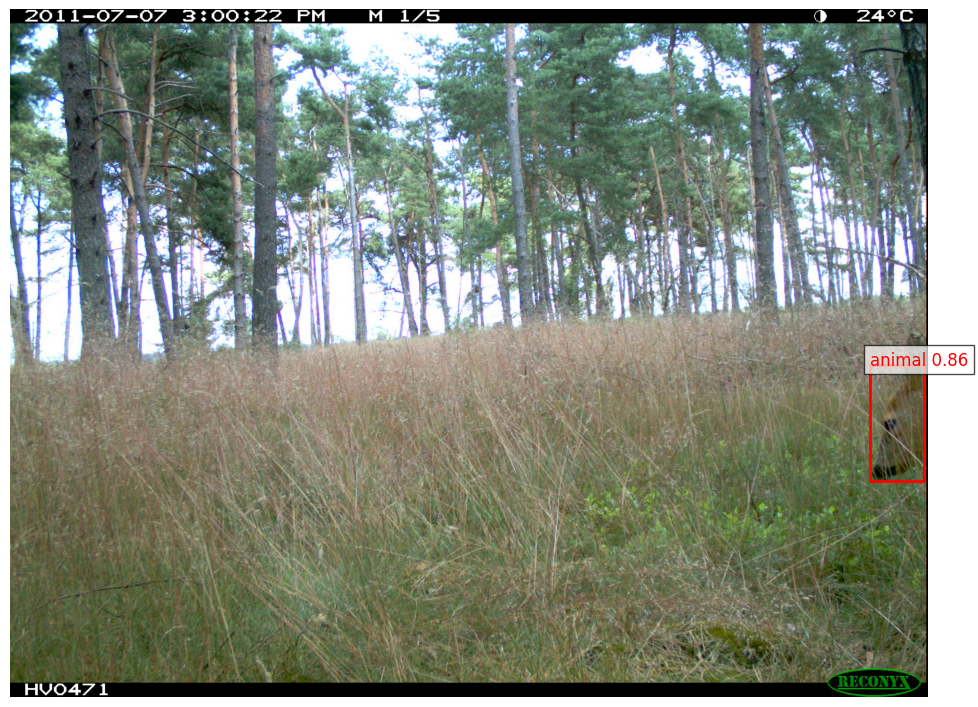


0: 640x640 1 animal, 45.1ms
Speed: 3.0ms preprocess, 45.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


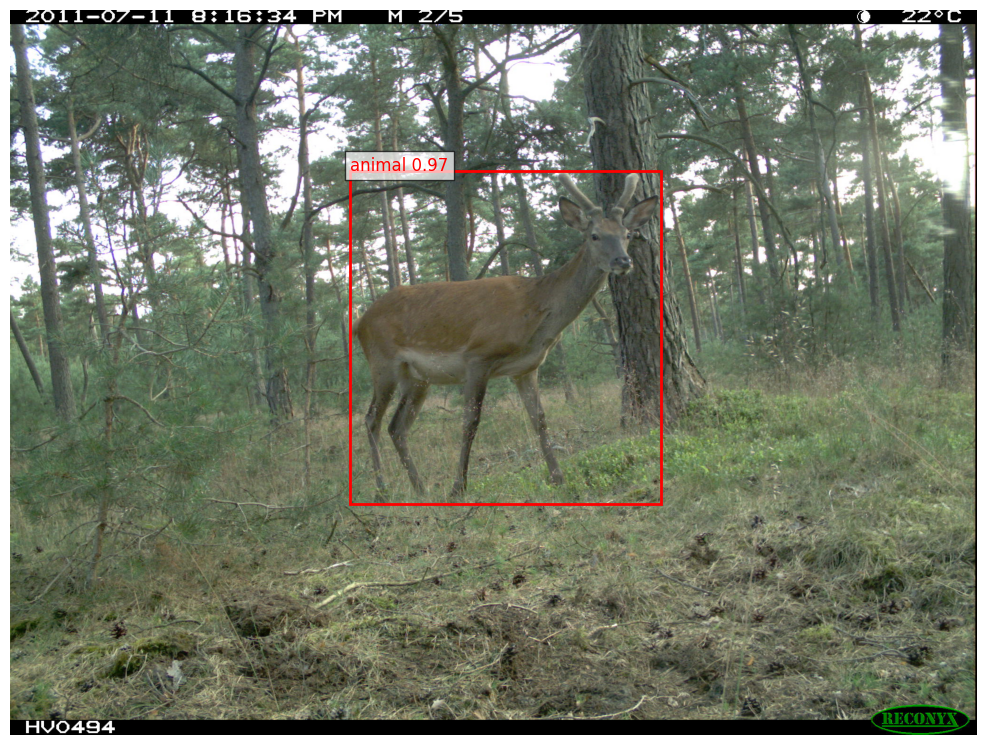


0: 640x640 1 animal, 49.0ms
Speed: 2.8ms preprocess, 49.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


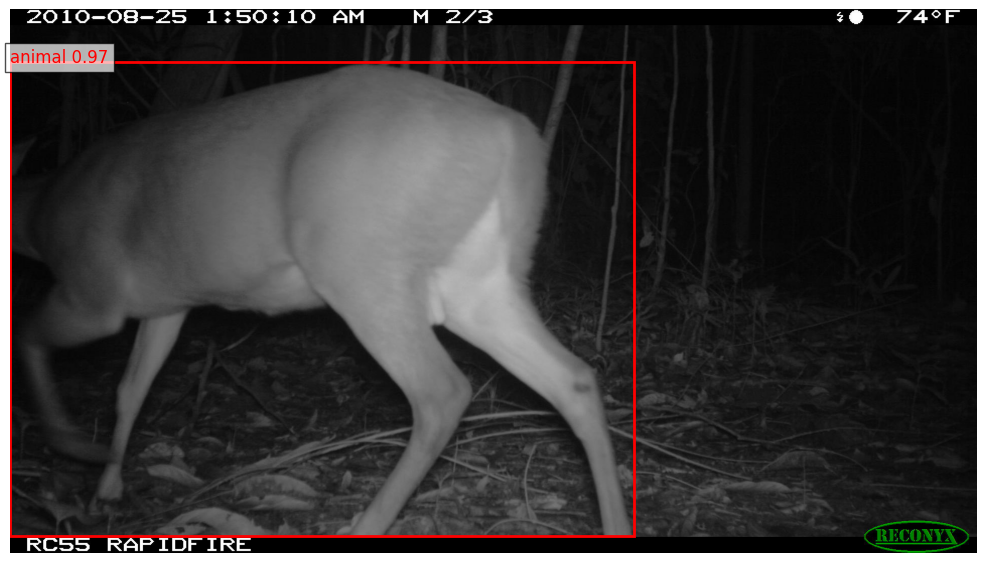


0: 640x640 1 animal, 48.9ms
Speed: 3.2ms preprocess, 48.9ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


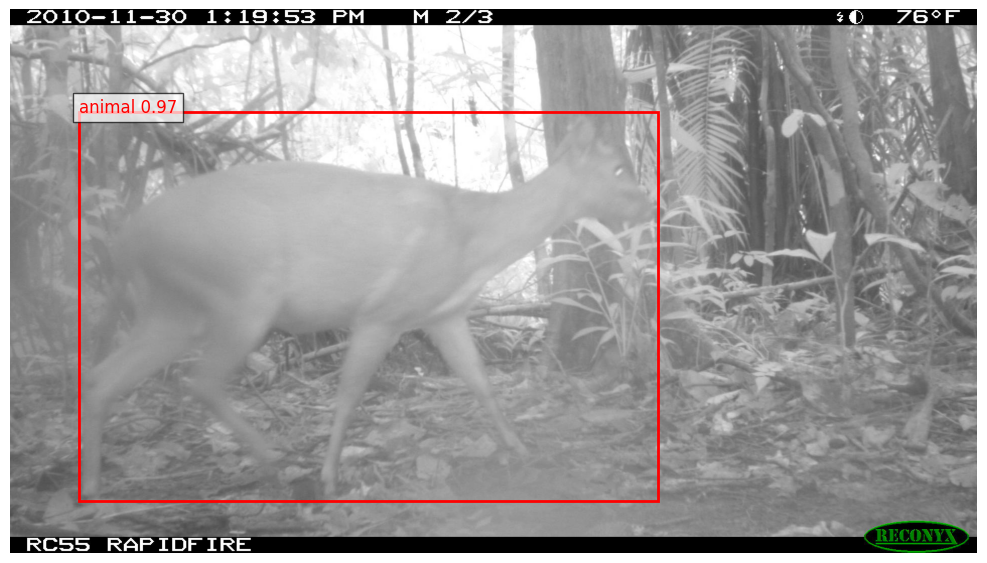


0: 640x640 1 animal, 48.9ms
Speed: 3.0ms preprocess, 48.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


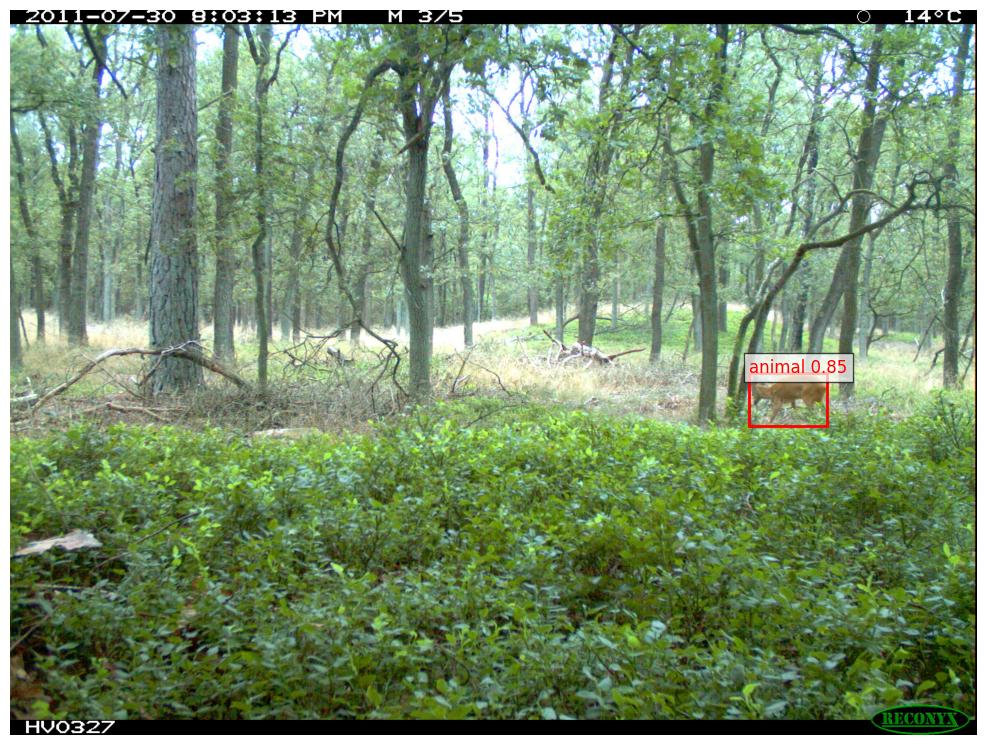


0: 640x640 2 animals, 1 person, 49.0ms
Speed: 3.1ms preprocess, 49.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


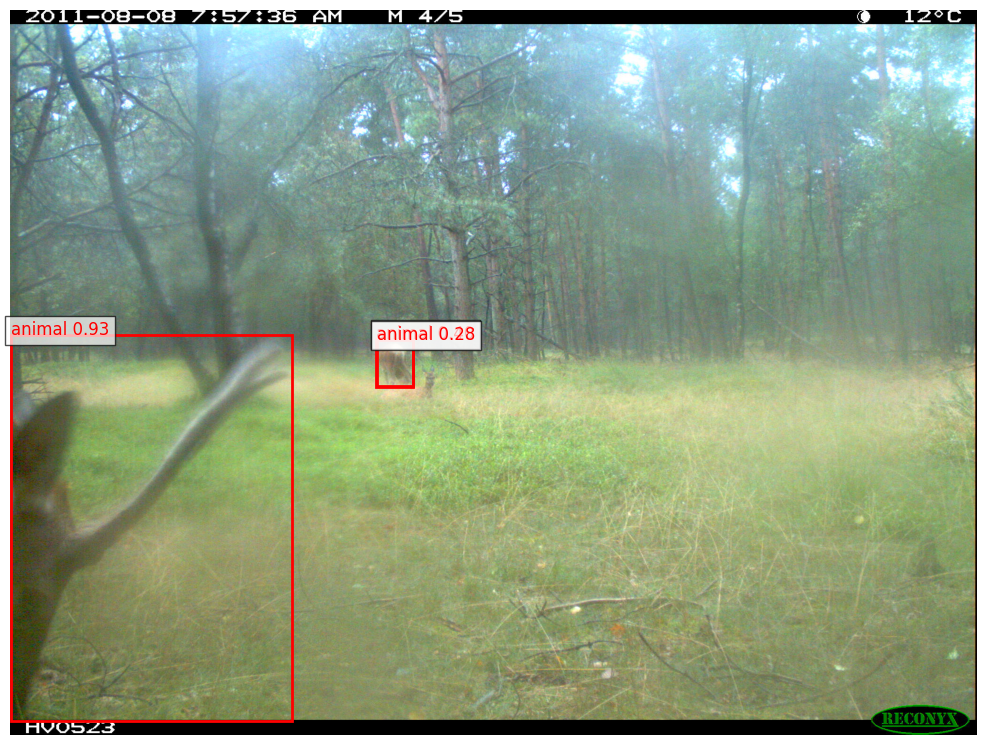


0: 640x640 1 animal, 49.0ms
Speed: 3.1ms preprocess, 49.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


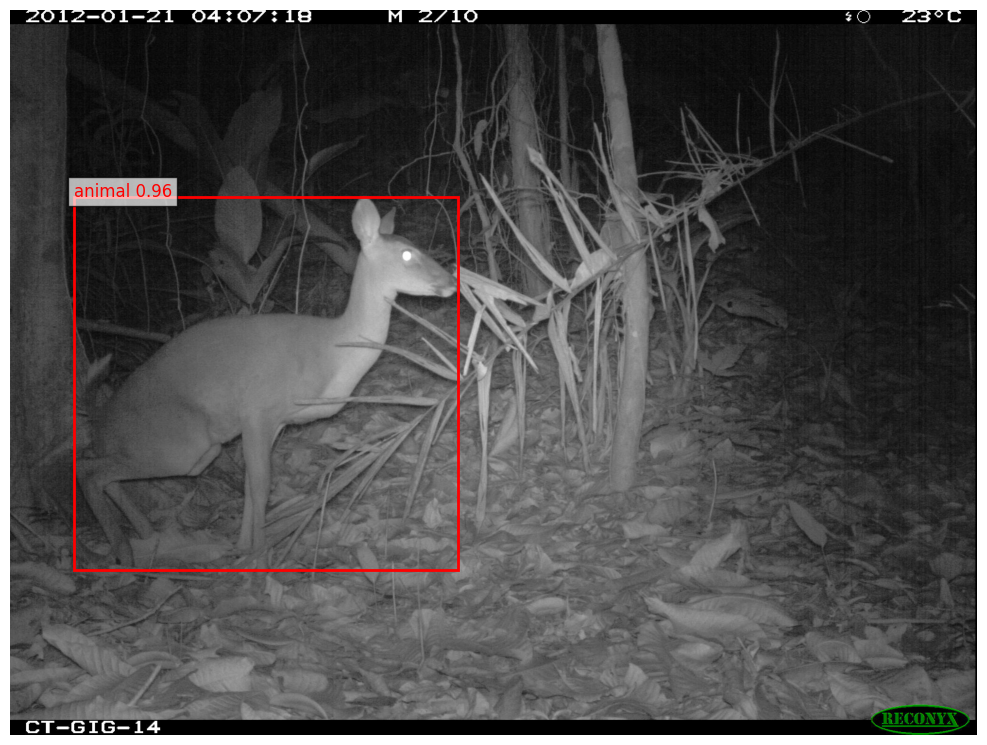


0: 640x640 1 animal, 48.9ms
Speed: 2.8ms preprocess, 48.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


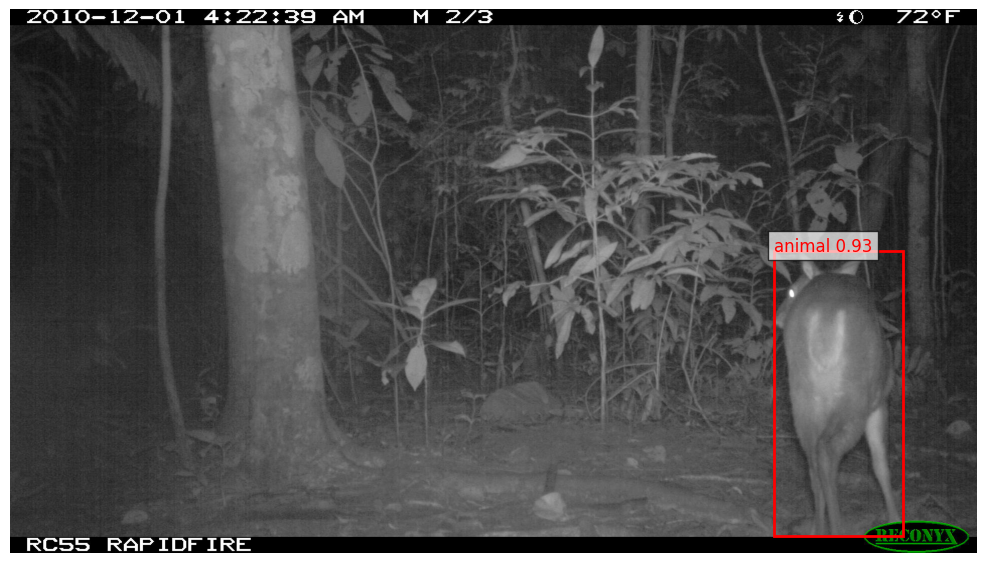


0: 640x640 3 animals, 49.0ms
Speed: 3.1ms preprocess, 49.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


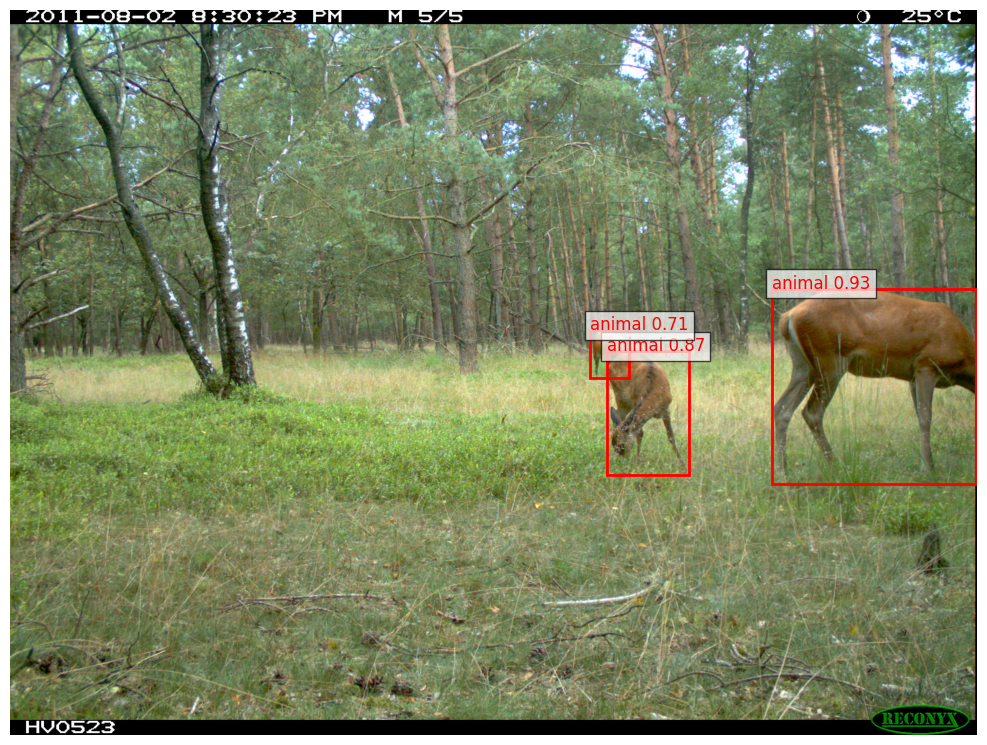


0: 640x640 1 animal, 48.9ms
Speed: 3.3ms preprocess, 48.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


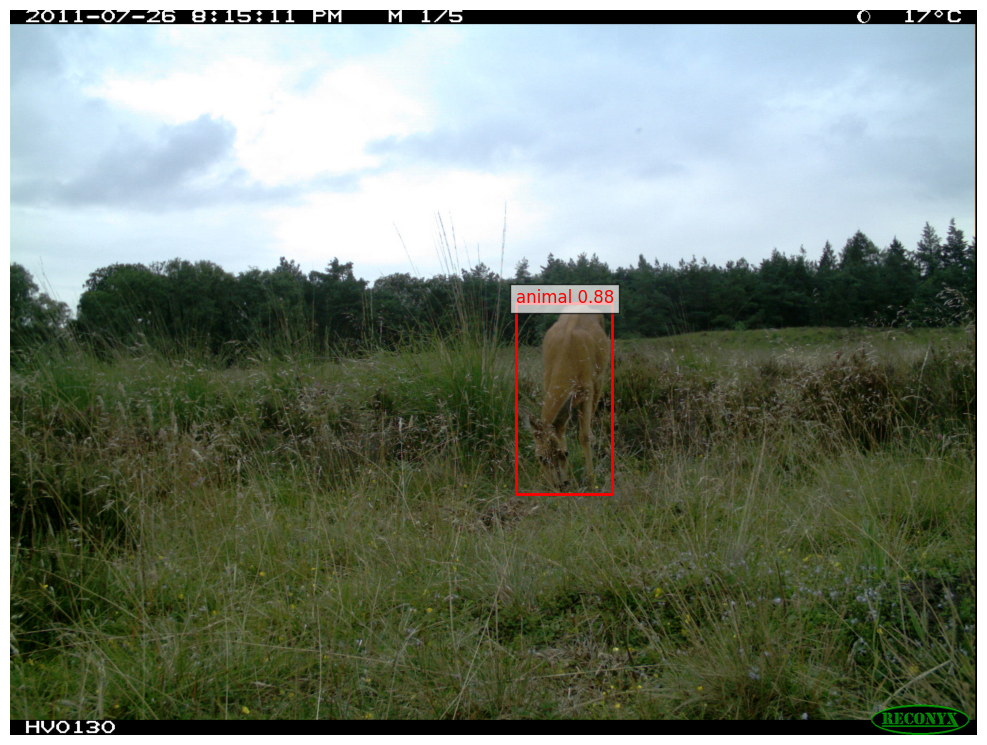

In [15]:
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from IPython.display import display
# import pw_detection  # Make sure MegaDetector is correctly set up

# Set up detection model once
detection_model = pw_detection.MegaDetectorV6(version="MDV6-yolov9-c")

# Set the root directory to sample from
dataset_root = "/kaggle/input/missouri-deer-species"
all_image_paths = []

# Traverse all class folders and subfolders to collect image paths
for class_folder in os.listdir(dataset_root):
    class_path = os.path.join(dataset_root, class_folder)
    if not os.path.isdir(class_path):
        continue
    for seq_folder in os.listdir(class_path):
        seq_path = os.path.join(class_path, seq_folder)
        if not os.path.isdir(seq_path):
            continue
        for filename in os.listdir(seq_path):
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                all_image_paths.append(os.path.join(seq_path, filename))

# Pick 10 random images
random.shuffle(all_image_paths)
sampled_paths = all_image_paths[:10]

# Process and display each image
for idx, image_path in enumerate(sampled_paths):
    try:
        img_pil = Image.open(image_path).convert("RGB")
        img_np = np.array(img_pil)
        detection_result = detection_model.single_image_detection(img_np)

        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(img_pil)
        detections = detection_result["detections"]
        boxes = detections.xyxy
        confidences = detections.confidence

        for i in range(len(boxes)):
            bbox = boxes[i]
            confidence = confidences[i]
            label = f"animal {confidence:.2f}"

            rect = Rectangle(
                (bbox[0], bbox[1]),
                bbox[2] - bbox[0],
                bbox[3] - bbox[1],
                linewidth=2,
                edgecolor='red',
                facecolor='none'
            )
            ax.add_patch(rect)

            ax.text(
                bbox[0], bbox[1],
                label,
                color='red',
                fontsize=12,
                bbox=dict(facecolor='white', alpha=0.7)
            )

        plt.axis('off')
        plt.tight_layout()
        display(fig)
        plt.close()

    except Exception as e:
        print(f"⚠️ Error processing image {image_path}: {e}")

# Cropping Images based on Bounding Boxes

In [1]:
import os
from PIL import Image
import json
json_file = "/kaggle/input/json-file/megadetector_results.json"
output_crops_dir = "/kaggle/working/cropped_images"

with open(json_file, 'r') as f:
    detections_data = json.load(f)

os.makedirs(output_crops_dir, exist_ok=True)

for img_path, image_data in detections_data.items():
    img_pil = Image.open(img_path).convert("RGB")
    
    for i, detection in enumerate(image_data["detections"]):
        bbox = detection["bbox"]  
        cropped_img = img_pil.crop((bbox[0], bbox[1], bbox[2], bbox[3]))
        crop_filename = f"{os.path.basename(img_path).split('.')[0]}_{i}.jpg"
        crop_path = os.path.join(output_crops_dir, crop_filename)
        cropped_img.save(crop_path)

# Visualization of Cropped Images

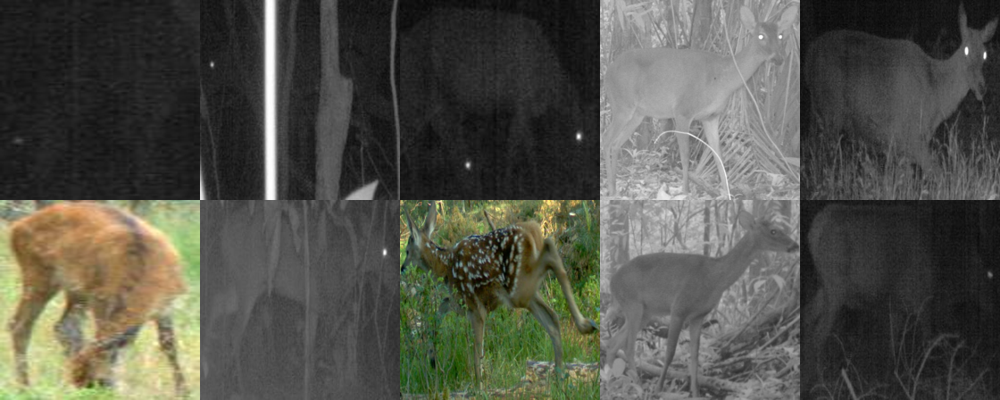

In [16]:
import os
import random
from PIL import Image
from IPython.display import display

cropped_dir = '/kaggle/working/cropped_images'
grid_rows, grid_cols = 2, 5
image_size = (224, 224)  

all_images = [
    os.path.join(cropped_dir, f)
    for f in os.listdir(cropped_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
]

random.shuffle(all_images)
selected = all_images[:grid_rows * grid_cols]
grid_img = Image.new('RGB', (image_size[0]*grid_cols, image_size[1]*grid_rows))

for idx, img_path in enumerate(selected):
    img = Image.open(img_path).resize(image_size)
    row, col = divmod(idx, grid_cols)
    grid_img.paste(img, (col * image_size[0], row * image_size[1]))

display(grid_img)

# Preprocessing Images for Classification 

In [2]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.resnet50 import preprocess_input
import numpy as np

image_size = (224, 224)
cropped_images = []
labels = []

for img_path, image_data in detections_data.items():
    for i, detection in enumerate(image_data["detections"]):
        crop_filename = f"{os.path.basename(img_path).split('.')[0]}_{i}.jpg"
        crop_path = os.path.join(output_crops_dir, crop_filename)
        img = load_img(crop_path, target_size=image_size)
        img_array = img_to_array(img)  
        img_array = np.expand_dims(img_array, axis=0)  
        img_array = preprocess_input(img_array)  
        
        cropped_images.append(img_array)
        species_label = image_data["class_label"]
        labels.append(species_label)

X = np.vstack(cropped_images)
y = np.array(labels)

print(f"Prepared {len(X)} images for classification.")

2025-04-14 19:17:35.814193: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744658255.999812      98 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744658256.053131      98 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Prepared 8865 images for classification.


# Training and Testing using ResNet50 Classifier

In [3]:
import os
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pickle

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_one_hot = to_categorical(y_encoded)

X_temp, X_test, y_temp, y_test = train_test_split(X, y_one_hot, test_size=0.1, random_state=42, stratify=y_one_hot)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42, stratify=y_temp)

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(len(label_encoder.classes_), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=x)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=7, batch_size=32)

model.save("/kaggle/working/species_classification_model.h5")
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)

train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

test_acc_list = [test_acc] * len(train_acc)
test_loss_list = [test_loss] * len(train_loss)

with open('/kaggle/working/training_metrics.pkl', 'wb') as f:
    pickle.dump({
        'train_acc': train_acc,
        'val_acc': val_acc,
        'test_acc': test_acc_list,
        'train_loss': train_loss,
        'val_loss': val_loss,
        'test_loss': test_loss_list
    }, f)

print("Training complete and metrics saved.")

I0000 00:00:1744658295.813673      98 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1744658295.815098      98 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Epoch 1/7


I0000 00:00:1744658318.072272     132 service.cc:148] XLA service 0x7b6aa00020f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1744658318.073505     132 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1744658318.073528     132 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1744658319.362002     132 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/200 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - accuracy: 0.3125 - loss: 2.2296 

I0000 00:00:1744658324.148811     132 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


200/200 ━━━━━━━━━━━━━━━━━━━━ 51s 176ms/step - accuracy: 0.7365 - loss: 1.0096 - val_accuracy: 0.8640 - val_loss: 0.3274
Epoch 2/7
200/200 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - accuracy: 0.8954 - loss: 0.2641 - val_accuracy: 0.8816 - val_loss: 0.2940
Epoch 3/7
200/200 ━━━━━━━━━━━━━━━━━━━━ 22s 112ms/step - accuracy: 0.9217 - loss: 0.1918 - val_accuracy: 0.9098 - val_loss: 0.2511
Epoch 4/7
200/200 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - accuracy: 0.9499 - loss: 0.1351 - val_accuracy: 0.9104 - val_loss: 0.2383
Epoch 5/7
200/200 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - accuracy: 0.9699 - loss: 0.0856 - val_accuracy: 0.9242 - val_loss: 0.2148
Epoch 6/7
200/200 ━━━━━━━━━━━━━━━━━━━━ 22s 112ms/step - accuracy: 0.9687 - loss: 0.0854 - val_accuracy: 0.9204 - val_loss: 0.2357
Epoch 7/7
200/200 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - accuracy: 0.9772 - loss: 0.0715 - val_accuracy: 0.9167 - val_loss: 0.2632
✅ Training complete and metrics saved.


# Test accuracy and loss

In [17]:
import pickle
import matplotlib.pyplot as plt
from IPython.display import display

with open('/kaggle/working/training_metrics.pkl', 'rb') as f:
    metrics = pickle.load(f)

train_acc = metrics['train_acc']
val_acc = metrics['val_acc']
test_acc_list = metrics['test_acc']
train_loss = metrics['train_loss']
val_loss = metrics['val_loss']
test_loss_list = metrics['test_loss']

test_acc = test_acc_list[0]
test_loss = test_loss_list[0]

print(f" Test Accuracy: {test_acc:.4f}")
print(f"  Test Loss: {test_loss:.4f}")

 Test Accuracy: 0.9222
  Test Loss: 0.1913


# Visualization of Results

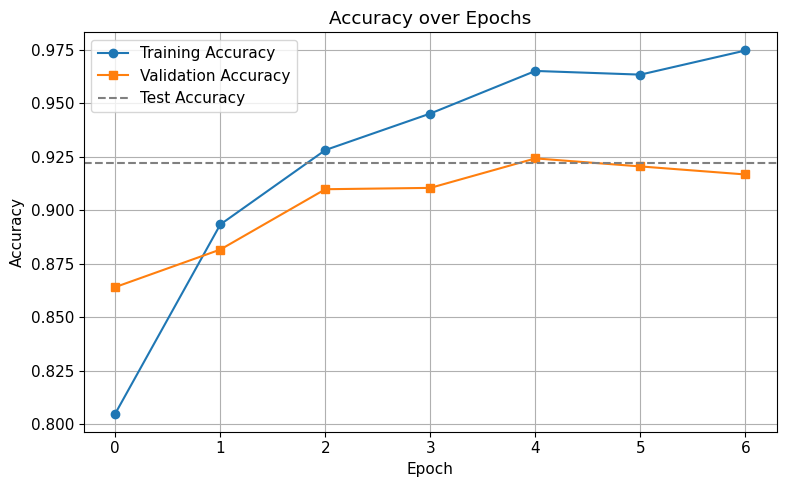

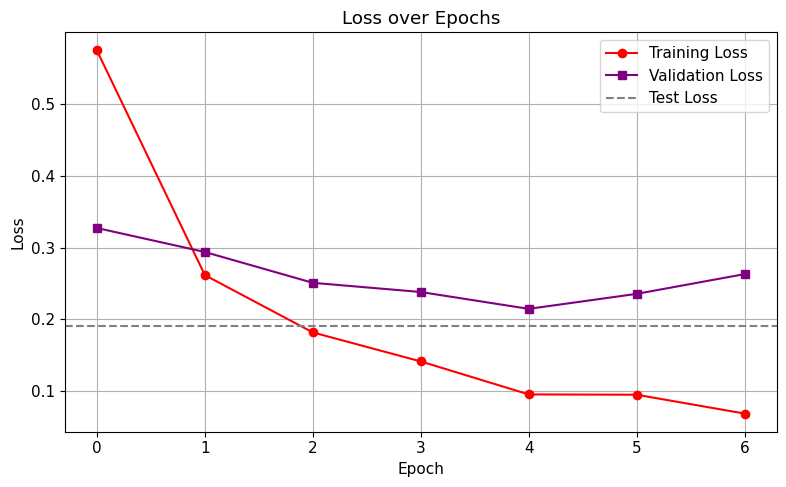

In [18]:
plt.figure(figsize=(8, 5))
plt.plot(train_acc, marker='o', label='Training Accuracy')
plt.plot(val_acc, marker='s', label='Validation Accuracy')
plt.axhline(y=test_acc, color='gray', linestyle='--', label='Test Accuracy')
plt.title("Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.tight_layout()
display(plt.gcf())
plt.close()

plt.figure(figsize=(8, 5))
plt.plot(train_loss, marker='o', label='Training Loss', color='red')
plt.plot(val_loss, marker='s', label='Validation Loss', color='purple')
plt.axhline(y=test_loss, color='gray', linestyle='--', label='Test Loss')
plt.title("Loss over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
display(plt.gcf())
plt.close()

# Analysis

The baseline ResNet50 model achieved promising results in classifying deer species from camera trap images, but also showed some limitations that we will  address in future iterations. During training, the model  reached high accuracy on the training set, indicating that it effectively captured discriminative features from the data. The use of a pretrained ResNet50 backbone, frozen during training, allowed for fast convergence and using general-purpose visual features learned from ImageNet. This approach is beneficial in scenarios where labeled data is limited, as in this case.

However, despite strong training performance, the validation and test accuracy remained somewhat lower, signaling a clear gap between training and generalization performance.  One contributing factor to this is the model's reliance on full-frame images, which often contain cluttered backgrounds, occlusions, or multiple animals. These extraneous details can confuse the classifier, especially when only the central animal is relevant for prediction. Because we used a pretrained classifier , it posed limitation to the extent of work that could be incorporated based on our specific dataset.
Additionally, freezing the ResNet50 backbone limited the model’s ability to adapt its features to the specific nuances of deer species, many of which exhibit subtle visual differences. This rigidity prevents the model from learning domain-specific representations.

Looking ahead, we’re planning to take things up a notch in our next deliverables. We’re planning to experiment with more advanced techniques, like CLIP (Contrastive Language-Image Pre-training), along with other cutting-edge methods that could boost our model’s performance. At the same time, we’re digging into research papers to keep up with the latest improvements in this field and make sure we’re on the right track.




# Reflection

## In this deliverable,
we started by gathering camera trap images featuring four different deer species. Our goal was straightforward: build a system that can detect animals in these images and then classify which of the four deer species they belong to. To get things rolling, we first used MegaDetector, a handy pre-trained tool that excels at spotting animals in camera trap photos. This step helped us pinpoint where the animals were in our dataset.

Next, we tackled the classification part. For this, we turned to ResNet50, a well-known deep learning model that’s great for identifying patterns in images. Using it, we worked to sort the detected animals into their specific deer species.

This notebook was all about diving deep into our dataset. It gave us the chance to fully explore the images, understand the ins and outs of our project, and get comfortable with fine-tuning our approach. What we built here is our baseline model—a solid starting point.

Looking ahead, we’re planning to take things up a notch in our next deliverables. We’re planning to experiment with more advanced techniques, like CLIP (Contrastive Language-Image Pre-training), along with other cutting-edge methods that could boost our model’s performance. At the same time, we’re digging into research papers to keep up with the latest improvements in this field and make sure we’re on the right track.

All in all, this notebook was a key first step—helping us set up our baseline and laying the groundwork for some exciting upgrades to come!